In [109]:
import os

# Sette miljøvariabler for DINOv3
# Dette bruker vi nedenfor for å finne nedlastede repoet: Du må skrive din egen sti her
os.environ["DINOV3_LOCATION"] = "D:/Dinov3"
print("DINOV3_LOCATION:", os.getenv("DINOV3_LOCATION"))

DINOV3_LOCATION: D:/Dinov3


In [110]:
# Laste ned alle pakkene som trengs: 
#%pip install torch torchvision pillow numpy matplotlib scipy scikit-learn tqdm


In [111]:
#importere nødvendige biblioteker

#import io
import os
import pickle
#import tarfile
import urllib

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.linear_model import LogisticRegression
import torch
import torchvision.transforms.functional as TF
from tqdm import tqdm



In [112]:
# sett DINOv3 location til miljøvariabelen

DINOV3_LOCATION = os.getenv("DINOV3_LOCATION")

if DINOV3_LOCATION is None:
    raise ValueError("DINOV3_LOCATION environment variabel er ikke satt. Se tidligere steg.")

print("DINOv3 location set to:", DINOV3_LOCATION)

DINOv3 location set to: D:/Dinov3


In [113]:

# Vi starer med denne, da denne er minst og krever mindre ressurser
MODEL_DINOV3_VITS = "dinov3_vits16"

# Andre modeller du kan prøve
# Husk at du må laste ned "weights" for den modellen du ønsker å bruke
MODEL_DINOV3_VITSP = "dinov3_vits16plus"
MODEL_DINOV3_VITB = "dinov3_vitb16"
MODEL_DINOV3_VITL = "dinov3_vitl16"
MODEL_DINOV3_VITHP = "dinov3_vith16plus"
MODEL_DINOV3_VIT7B = "dinov3_vit7b16"

# we take DINOv3 ViT-S (since we have the pretrained weights for this model)
MODEL_NAME =  MODEL_DINOV3_VITS # Her kan du velge en annen modell 

# Load model without pretrained weights to avoid web download
model = torch.hub.load(
    repo_or_dir=DINOV3_LOCATION,
    model=MODEL_NAME,
    source="local",
    pretrained=True 
)

# Set model to evaluation mode and move to GPU
model.eval()
model.cuda()

# Test the model with a small dummy input to see if it produces valid output
print("\nTesting model with dummy input...")
dummy_input = torch.randn(1, 3, 224, 224).cuda()
with torch.no_grad():
    try:
        test_output = model(dummy_input)
        print(f"Model test successful. Output shape: {test_output.shape}")
        print(f"Output has NaN: {torch.isnan(test_output).any()}")
        print(f"Output range: {test_output.min():.4f} to {test_output.max():.4f}")
    except Exception as e:
        print(f"Model test failed: {e}")
        print("There might be an issue with the model or checkpoint loading.")


Testing model with dummy input...
Model test successful. Output shape: torch.Size([1, 384])
Output has NaN: False
Output range: -1.8930 to 1.7545


### Steg 1 & 2
Samler all treningsdata og tilhørende masker for videre prosessering

In [114]:

# Bruke bilder som er lagret lokalt på på "data" mappen
image_folder = "./Treningsdata"
label_folder = "./Treningsdata_Masked"

def load_images_from_folder(folder: str) -> list[Image.Image]:
    images = []
    for filename in sorted(os.listdir(folder)):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            img = Image.open(os.path.join(folder, filename))
            images.append(img)
            print(f"Loaded {filename} from {folder}")

    print(f"Total images loaded from {folder}: {len(images)}\n")
    return images

images = load_images_from_folder(image_folder)
labels = load_images_from_folder(label_folder)
n_images = len(images)

assert n_images == len(labels), f"{len(images)=}, {len(labels)=}" # Sjekke at vi har like mange bilder og labels

print(f"Loaded {n_images} images and labels from local folders")




Loaded Image01.png from ./Treningsdata
Loaded Image02.png from ./Treningsdata
Loaded Image03.png from ./Treningsdata
Loaded Image04.png from ./Treningsdata
Loaded Image05.png from ./Treningsdata
Loaded Image06.png from ./Treningsdata
Loaded Image07.png from ./Treningsdata
Loaded Image08.png from ./Treningsdata
Loaded Image09.png from ./Treningsdata
Loaded Image10.png from ./Treningsdata
Total images loaded from ./Treningsdata: 10

Loaded Label01.png from ./Treningsdata_Masked
Loaded Label02.png from ./Treningsdata_Masked
Loaded Label03.png from ./Treningsdata_Masked
Loaded Label04.png from ./Treningsdata_Masked
Loaded Label05.png from ./Treningsdata_Masked
Loaded Label06.png from ./Treningsdata_Masked
Loaded Label07.png from ./Treningsdata_Masked
Loaded Label08.png from ./Treningsdata_Masked
Loaded Label09.png from ./Treningsdata_Masked
Loaded Label10.png from ./Treningsdata_Masked
Total images loaded from ./Treningsdata_Masked: 10

Loaded 10 images and labels from local folders


### Steg 3 & 4

In [115]:
# Konstanter for patch-størrelse og bilde-størrelse

PATCH_SIZE = 16    # Hver patch er 16×16 piksler
IMAGE_SIZE = 768   # Standard høyde vi skalerer til (768÷16 = 48 patches høyt)

In [116]:
patch_quant_filter = torch.nn.Conv2d(1, 1, PATCH_SIZE, stride=PATCH_SIZE, bias=False)
patch_quant_filter.weight.data.fill_(1.0 / (PATCH_SIZE * PATCH_SIZE)) # Fyller data med 1/(16*16)= 0.00390625


tensor([[[[0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 

In [117]:
# Denne funksjonen bruker vi videre for å endre størrelse på maskene slik at de passer med patch-størrelsen
def resize_transform(mask_image: Image, image_size: int = IMAGE_SIZE, patch_size: int = PATCH_SIZE) -> torch.Tensor:
    w, h = mask_image.size                              # Original størrelse
    h_patches = int(image_size / patch_size)            # Antall patches vertikalt (768÷16=48)
    w_patches = int((w * image_size) / (h * patch_size)) # Antall patches horisontalt
    return TF.to_tensor(TF.resize(mask_image, (h_patches * patch_size, w_patches * patch_size)))

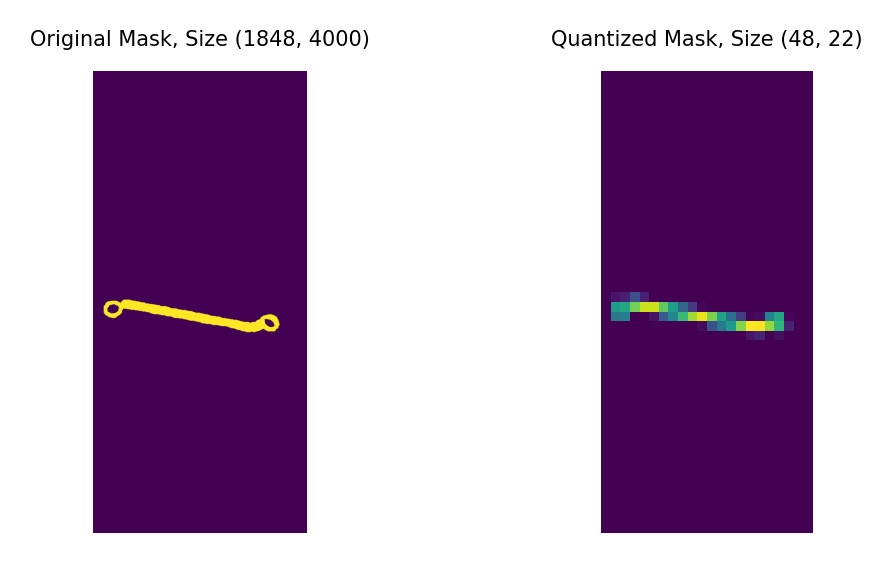

In [118]:
# Her henter vi en maske og viser original og kvantisert maske
# Vi splitter masken i ulike kanaler (RGBA) og bruker bare alpha-kanalen som er siste kanal
mask_0 = labels[1].split()[-1] 
mask_0_resized = resize_transform(mask_0)

with torch.no_grad():
    mask_0_quantized = patch_quant_filter(mask_0_resized).squeeze().detach().cpu()

plt.figure(figsize=(4, 2), dpi=300)
plt.subplot(1, 2, 1)
plt.imshow(mask_0)
plt.axis('off')
plt.title(f"Original Mask, Size {mask_0.size}", fontsize=5)
plt.subplot(1, 2, 2)
plt.imshow(mask_0_quantized)
plt.axis('off')
plt.title(f"Quantized Mask, Size {tuple(mask_0_quantized.shape)}", fontsize=5)
plt.show()

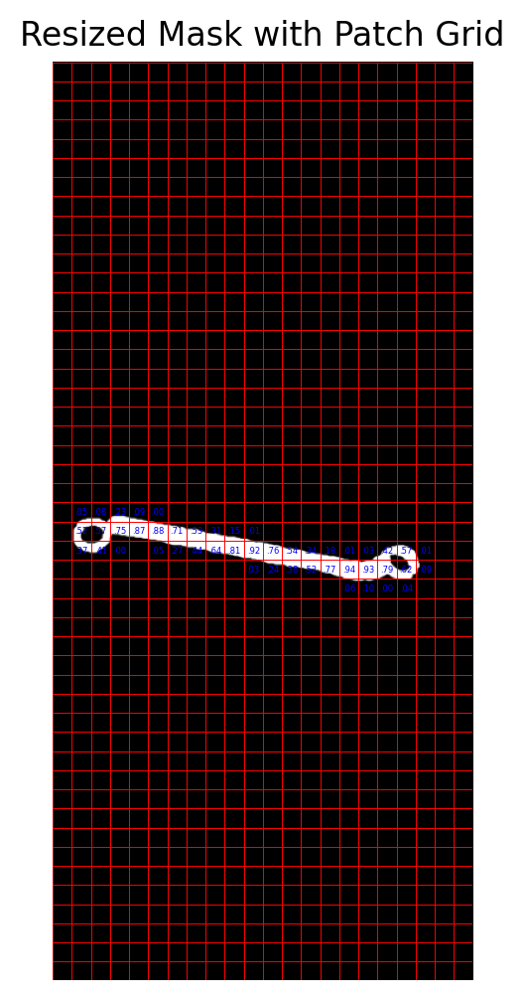

In [119]:
import matplotlib.patches as patches

# Plot with grid overlay
plt.figure(figsize=(6, 6), dpi=200)
plt.imshow(mask_0_resized.squeeze().numpy(), cmap="gray")
plt.axis("off")
plt.title("Resized Mask with Patch Grid")

h, w = mask_0_resized.shape[1:]
for y in range(0, h, PATCH_SIZE):
    for x in range(0, w, PATCH_SIZE):
        rect = patches.Rectangle((x, y), PATCH_SIZE, PATCH_SIZE,
                                 linewidth=0.3, edgecolor="red", facecolor="none")

        # Prosentandel av "foreground" i denne patchen        
        foreground_present = mask_0_quantized[y // PATCH_SIZE, x // PATCH_SIZE]

        # Vise bare tekst hvis det er noe "foreground" i patchen
        if foreground_present != 0:
            rect_text = f"{foreground_present:.2f}" # Tar med to desimaler
            
            # Formatere teksten for å unngå store tall som 0.07 eller 1.00 etc.
            # Splitter teksten ved desimalpunktet, vi får tilbake en liste med to elementer for eksempel 0.07 --> ["0", "07"]
            rect_text_split = rect_text.split(".")
            if rect_text_split[0] == "0":
                rect_text = f".{rect_text_split[1]}"
            elif rect_text_split[0] == "1":
                rect_text = f"{rect_text_split[0]}"
            else:
                rect_text = f"{rect_text_split[0]}.{rect_text_split[1]}"

            plt.text(x + PATCH_SIZE / 2, y + PATCH_SIZE / 2, rect_text,
                    color="blue", fontsize=3, ha="center", va="center")
        plt.gca().add_patch(rect)


plt.show()

In [120]:
# Vi kan printe litt informasjon om modellen
print(model)

DinoVisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 384, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (rope_embed): RopePositionEmbedding()
  (blocks): ModuleList(
    (0-11): 12 x SelfAttentionBlock(
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (attn): SelfAttention(
        (qkv): LinearKMaskedBias(in_features=384, out_features=1152, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=384, out_features=384, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): LayerScale()
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=1536, out_features=384, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
      (ls2): LayerScale()
    )
  )
  (norm): LayerN

Processing images:   0%|          | 0/10 [00:00<?, ?it/s]

Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 384, 48, 22])]
dim = 384
Feature map shape: torch.Size([1, 384, 48, 22])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].


feature fra siste lag: tensor([[[[ 2.8410e-01,  2.4100e-01,  3.4877e-01,  ...,  1.0705e-01,
            1.4824e-01, -1.5798e-02],
          [ 1.6413e-01, -2.3266e-02,  5.9921e-02,  ...,  7.3892e-02,
           -2.4886e-02,  8.4331e-02],
          [ 1.7386e-02,  3.7509e-02,  1.3204e-01,  ...,  1.1312e-01,
            3.0896e-02,  1.2877e-01],
          ...,
          [ 3.8778e-02, -1.2392e-02,  3.0094e-02,  ...,  9.7077e-02,
            8.0979e-02, -5.5204e-02],
          [-1.3617e-01, -5.7725e-02,  7.7247e-02,  ...,  1.4691e-01,
            1.4799e-01, -1.5969e-02],
          [-4.9267e-02,  1.4448e-01,  2.8105e-01,  ...,  1.9687e-01,
           -1.9727e-02, -2.9713e-02]],

         [[-1.0262e-01, -4.3352e-02, -3.2231e-02,  ..., -1.5318e-02,
            1.0185e-01,  1.5555e-01],
          [-7.2940e-02,  1.3828e-02, -9.4212e-03,  ..., -6.0513e-02,
            4.3611e-02,  8.7636e-02],
          [ 8.1588e-02,  8.5723e-02,  1.0301e-01,  ...,  7.2628e-04,
            6.6861e-02,  8.3965e-02

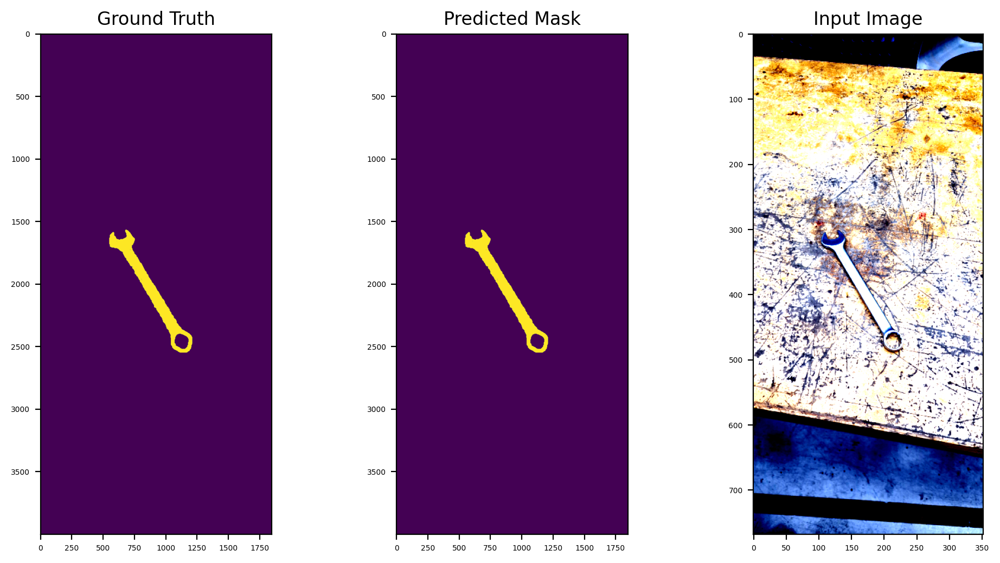

Processing images:  10%|█         | 1/10 [00:01<00:15,  1.77s/it]

torch.Size([1056, 384])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 384, 48, 22])]
dim = 384
Feature map shape: torch.Size([1, 384, 48, 22])
feature fra siste lag: tensor([[[[-0.3337, -0.2767, -0.2528,  ...,  0.0256, -0.0605, -0.1060],
          [-0.4174, -0.4986, -0.4540,  ..., -0.0500,  0.0944, -0.0812],
          [-0.6370, -0.4957, -0.4640,  ...,  0.0121,  0.0044, -0.2087],
          ...,
          [ 0.0348,  0.2150,  0.3785,  ..., -0.1127, -0.0955, -0.0409],
          [ 0.1598,  0.1708,  0.3061,  ..., -0.1559, -0.1621, -0.1411],
          [ 0.1348,  0.1054,  0.2634,  ..., -0.0808, -0.0922, -0.0773]],

         [[-0.2342, -0.2077, -0.1866,  ..., -0.2787, -0.2266, -0.2868],
          [-0.1310, -0.1004, -0.1346,  ..., -0.1741, -0.1395, -0.0808],
          [-0.1768,  0.0059, -0.0030,  ..., -0.2125, -0.0819, -0.0948],
          ...,
          [ 0.0876,  0.0670, -0.0885,  ..., -0.2317, -0.1274, -0.0214],
          [ 0.0178,  0.0719,  0.0092,  ..., -0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.64].


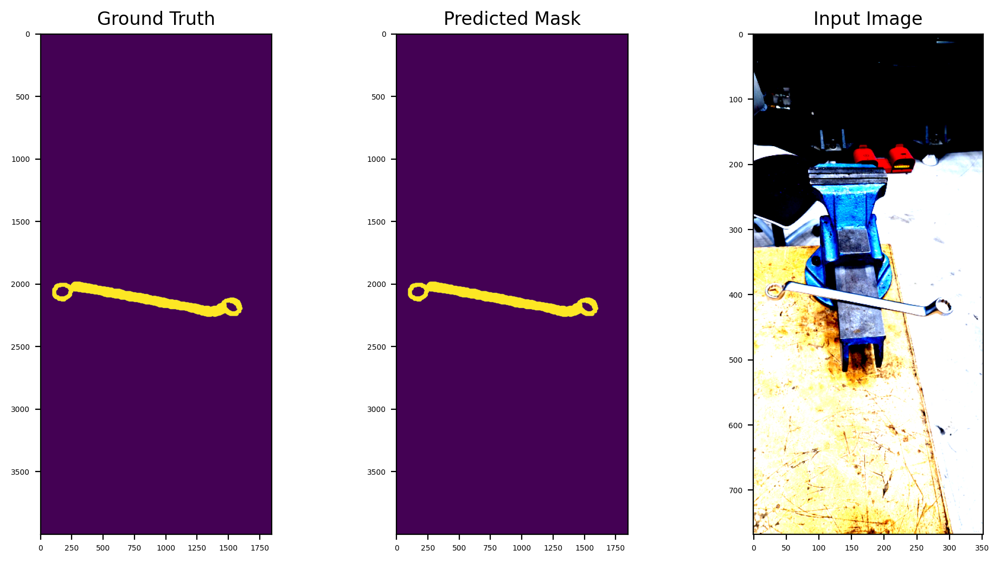

Processing images:  20%|██        | 2/10 [00:03<00:13,  1.71s/it]

torch.Size([1056, 384])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 384, 48, 22])]
dim = 384
Feature map shape: torch.Size([1, 384, 48, 22])
feature fra siste lag: tensor([[[[-0.4506, -0.3629, -0.3398,  ...,  0.1807,  0.0558,  0.0856],
          [-0.6293, -0.2446, -0.3702,  ...,  0.1198, -0.0165, -0.0060],
          [-0.3258, -0.4528, -0.6981,  ...,  0.0543, -0.0335, -0.0801],
          ...,
          [ 0.0717,  0.1228,  0.0918,  ...,  0.5038,  0.4966,  0.3544],
          [ 0.0634,  0.1294,  0.0864,  ...,  0.5910,  0.4583,  0.3929],
          [ 0.0411,  0.1926,  0.1854,  ...,  0.3833,  0.4225,  0.3720]],

         [[-0.4137, -0.3557, -0.2621,  ..., -0.0985, -0.0428, -0.0434],
          [-0.2677, -0.4750, -0.4090,  ..., -0.0646,  0.0168,  0.0423],
          [-0.4030, -0.3151, -0.3425,  ..., -0.1725,  0.0019,  0.0238],
          ...,
          [-0.0760, -0.1528, -0.1342,  ..., -0.2670, -0.1709, -0.0616],
          [-0.1165, -0.1659, -0.2435,  ..., -0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.64].


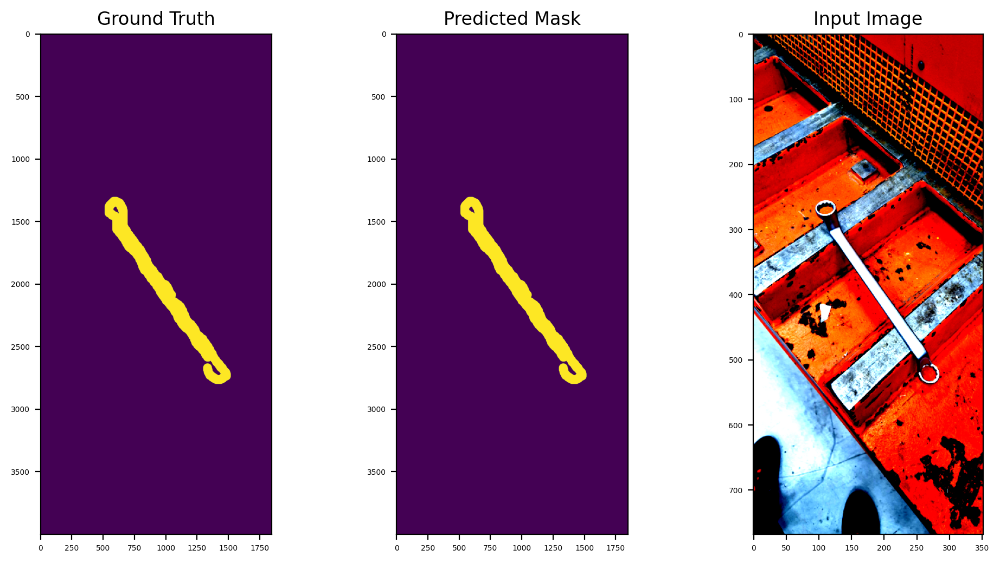

Processing images:  30%|███       | 3/10 [00:05<00:11,  1.69s/it]

torch.Size([1056, 384])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 384, 48, 22])]
dim = 384
Feature map shape: torch.Size([1, 384, 48, 22])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0322802..2.64].


feature fra siste lag: tensor([[[[ 0.0617,  0.0972,  0.1806,  ..., -0.0699, -0.0804, -0.0275],
          [-0.0868,  0.0640,  0.1161,  ..., -0.0010, -0.1305, -0.1972],
          [-0.0615,  0.0511,  0.1413,  ...,  0.0513, -0.0827, -0.1808],
          ...,
          [ 0.0604,  0.1557,  0.1167,  ...,  0.1851,  0.2565,  0.0786],
          [ 0.0996,  0.2498,  0.2480,  ...,  0.1323,  0.1718,  0.1255],
          [ 0.2602,  0.2720,  0.1641,  ...,  0.1772,  0.1536,  0.2093]],

         [[-0.0296, -0.0285, -0.0682,  ..., -0.3437, -0.2362, -0.2485],
          [-0.0011,  0.0816,  0.0412,  ..., -0.2750, -0.1264, -0.1178],
          [ 0.1447,  0.1128,  0.0352,  ..., -0.1922, -0.1206, -0.0978],
          ...,
          [-0.4274, -0.3529, -0.4688,  ..., -0.1232, -0.0382,  0.0469],
          [-0.2940, -0.3440, -0.3277,  ..., -0.1346, -0.1586, -0.1113],
          [-0.3512, -0.3226, -0.4697,  ..., -0.2874, -0.0861, -0.1891]],

         [[ 0.1243,  0.5034,  0.5874,  ...,  0.2312,  0.6642,  0.1516],
       

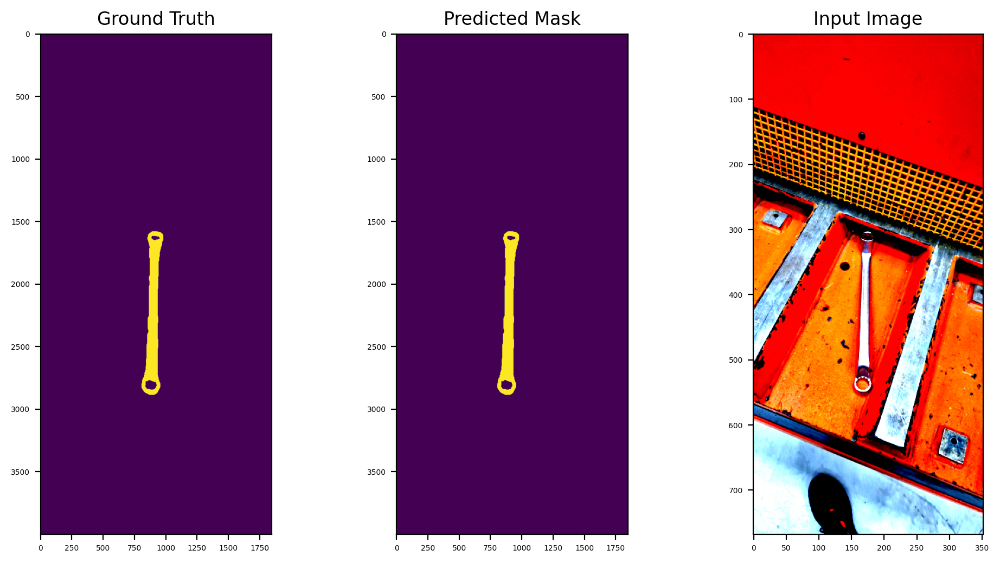

Processing images:  40%|████      | 4/10 [00:06<00:10,  1.71s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.622571].


torch.Size([1056, 384])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 384, 48, 22])]
dim = 384
Feature map shape: torch.Size([1, 384, 48, 22])
feature fra siste lag: tensor([[[[-0.1169, -0.1107,  0.7915,  ...,  0.5803,  0.4785,  0.6376],
          [-0.2467, -0.3311,  0.4505,  ...,  0.3439,  0.4234,  0.3799],
          [-0.2975, -0.2707,  0.2717,  ...,  0.4955,  0.3251,  0.5589],
          ...,
          [ 0.1803,  0.3294,  0.2249,  ...,  0.0998,  0.0322, -0.0689],
          [ 0.1849,  0.2204,  0.4082,  ...,  0.1991,  0.0751, -0.0463],
          [ 0.2006,  0.1961,  0.4183,  ...,  0.2557,  0.1767, -0.0393]],

         [[-0.1164, -0.1571,  0.0509,  ..., -0.0606,  0.0160,  0.0142],
          [-0.0494, -0.1680,  0.0609,  ...,  0.0376, -0.0186,  0.0524],
          [-0.0405, -0.0503,  0.0019,  ...,  0.1251,  0.0433, -0.0026],
          ...,
          [-0.3352, -0.3671, -0.5025,  ..., -0.3425, -0.2314, -0.2027],
          [-0.3348, -0.3163, -0.4731,  ..., -0.

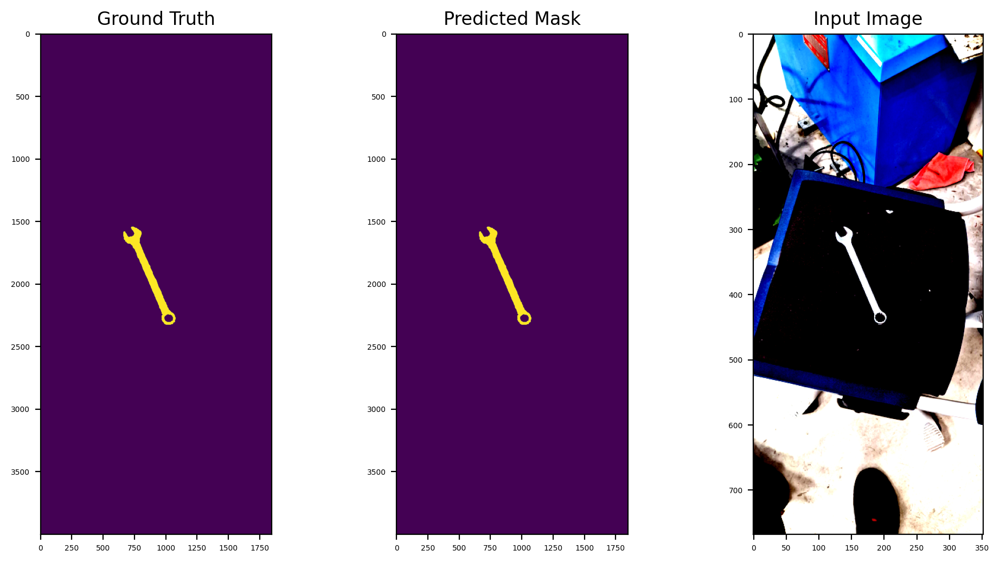

Processing images:  50%|█████     | 5/10 [00:08<00:08,  1.68s/it]

torch.Size([1056, 384])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 384, 48, 22])]
dim = 384
Feature map shape: torch.Size([1, 384, 48, 22])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.622571].


feature fra siste lag: tensor([[[[ 0.2796,  0.3969,  0.3732,  ...,  0.0038, -0.2316, -0.3639],
          [ 0.2162,  0.3443,  0.3737,  ..., -0.1884, -0.4350, -0.3790],
          [ 0.2227,  0.2987,  0.3650,  ..., -0.2835, -0.5832, -0.4371],
          ...,
          [-0.1374, -0.0587,  0.0410,  ...,  0.4385,  0.4313,  0.4098],
          [-0.1034, -0.0332,  0.0491,  ...,  0.5567,  0.3833,  0.4066],
          [ 0.0370, -0.0519,  0.0364,  ...,  0.3244,  0.5032,  0.3743]],

         [[ 0.3314,  0.3488,  0.2728,  ..., -0.3308, -0.2215, -0.0799],
          [ 0.3536,  0.2523,  0.2044,  ..., -0.2761, -0.1412, -0.0712],
          [ 0.3656,  0.3837,  0.3224,  ..., -0.2779, -0.1126, -0.0808],
          ...,
          [ 0.0578, -0.1428, -0.1287,  ..., -0.4985, -0.4243, -0.3835],
          [ 0.0051, -0.1904, -0.1291,  ..., -0.5794, -0.4520, -0.4392],
          [-0.2251, -0.1626, -0.1536,  ..., -0.7125, -0.5055, -0.4338]],

         [[-0.1708,  0.0199, -0.0358,  ...,  0.1333,  0.0836,  0.0411],
       

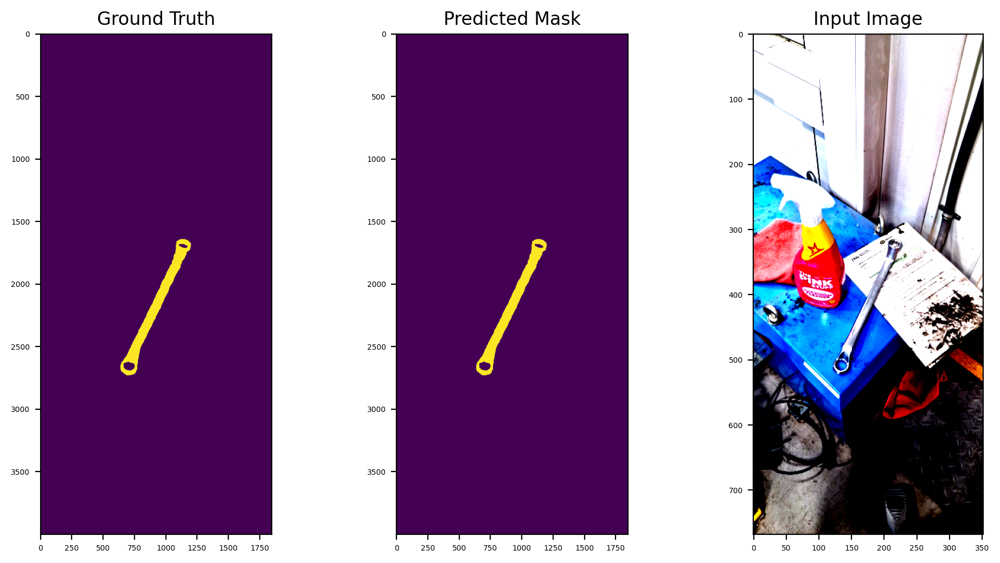

Processing images:  60%|██████    | 6/10 [00:10<00:06,  1.69s/it]

torch.Size([1056, 384])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 384, 48, 22])]
dim = 384
Feature map shape: torch.Size([1, 384, 48, 22])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.64].


feature fra siste lag: tensor([[[[-0.0673, -0.0208,  0.1851,  ...,  0.0083, -0.0877, -0.0431],
          [-0.1434,  0.0421,  0.1037,  ..., -0.3667, -0.2187, -0.2501],
          [-0.1888, -0.0732, -0.0399,  ..., -0.1695, -0.2370, -0.3002],
          ...,
          [-0.0065,  0.0758,  0.2140,  ...,  0.1975,  0.0795, -0.0691],
          [ 0.0360,  0.0738,  0.2153,  ...,  0.3412,  0.1941, -0.0886],
          [-0.0729,  0.0747,  0.2697,  ...,  0.2866,  0.2211, -0.0059]],

         [[-0.3453, -0.3147, -0.2800,  ..., -0.8208, -0.8048, -0.7085],
          [-0.3137, -0.2460, -0.2754,  ..., -0.8295, -0.6317, -0.6457],
          [-0.2507, -0.2155, -0.2279,  ..., -0.6699, -0.5972, -0.6229],
          ...,
          [-0.3626, -0.3983, -0.3106,  ..., -0.5809, -0.4024, -0.4211],
          [-0.4086, -0.3130, -0.4462,  ..., -0.4734, -0.3474, -0.4694],
          [-0.3510, -0.3533, -0.3349,  ..., -0.5135, -0.3962, -0.3446]],

         [[ 0.1433,  0.3453,  0.5980,  ..., -0.0701, -0.0578,  0.0040],
       

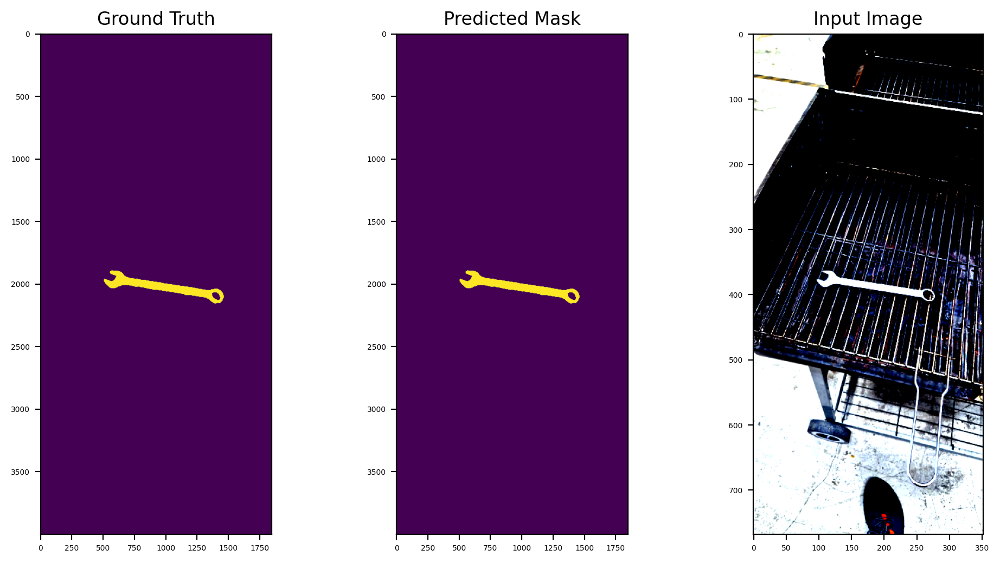

Processing images:  70%|███████   | 7/10 [00:11<00:05,  1.70s/it]

torch.Size([1056, 384])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 384, 48, 22])]
dim = 384
Feature map shape: torch.Size([1, 384, 48, 22])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.64].


feature fra siste lag: tensor([[[[ 2.0723e-02, -2.4184e-01, -1.6246e-01,  ...,  9.2035e-03,
           -1.0188e-01,  1.1128e-02],
          [-2.5914e-01, -3.0826e-01, -1.8409e-01,  ..., -2.1406e-02,
           -4.5646e-03, -1.7131e-01],
          [-3.2509e-01, -4.1996e-01, -3.2053e-01,  ..., -3.1031e-02,
           -7.5711e-02, -1.8634e-01],
          ...,
          [-2.0253e-01,  1.8427e-01,  3.1634e-01,  ..., -3.6731e-02,
           -7.5689e-02,  3.5528e-02],
          [-2.2096e-01,  1.1850e-01,  2.6058e-01,  ..., -2.7518e-02,
           -6.8966e-02,  5.9090e-02],
          [ 3.9613e-04,  2.2857e-02,  2.5075e-01,  ...,  2.0569e-02,
           -1.0099e-01, -7.7170e-02]],

         [[-3.2965e-01, -2.4047e-01, -2.0727e-01,  ..., -2.1706e-01,
           -1.1686e-01, -1.4148e-01],
          [-2.4191e-01, -2.3986e-01, -2.6645e-01,  ..., -1.2256e-01,
           -1.8813e-01, -1.5097e-01],
          [-2.2025e-01, -1.5707e-01, -1.6072e-01,  ..., -1.3192e-01,
           -1.4197e-01, -1.8263e-02

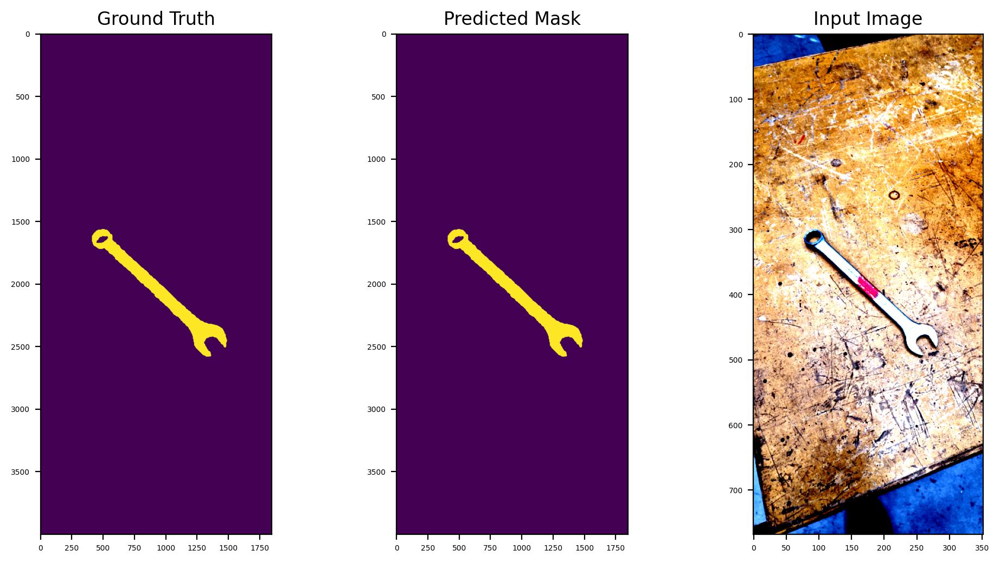

Processing images:  80%|████████  | 8/10 [00:13<00:03,  1.71s/it]

torch.Size([1056, 384])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 384, 48, 22])]
dim = 384
Feature map shape: torch.Size([1, 384, 48, 22])
feature fra siste lag: tensor([[[[ 0.1278,  0.2595,  0.2921,  ..., -0.0620, -0.2177, -0.2604],
          [-0.0483,  0.1742,  0.1939,  ..., -0.1472, -0.3015, -0.4079],
          [-0.0460,  0.1616,  0.3301,  ..., -0.2196, -0.3051, -0.4868],
          ...,
          [ 0.2422,  0.3071,  0.2085,  ...,  0.1199, -0.0127, -0.1252],
          [ 0.1438,  0.4291,  0.2313,  ...,  0.1844, -0.0145, -0.0971],
          [ 0.2381,  0.3539,  0.3277,  ...,  0.1739, -0.1203, -0.1202]],

         [[-0.1265, -0.1883, -0.1976,  ..., -0.3885, -0.1509, -0.1335],
          [-0.0884, -0.0607, -0.1934,  ..., -0.1542, -0.1821, -0.0265],
          [ 0.0211, -0.0641, -0.1565,  ..., -0.1276, -0.0852,  0.0233],
          ...,
          [ 0.2681,  0.2561,  0.1458,  ...,  0.0625,  0.1420,  0.0577],
          [ 0.4075,  0.3486,  0.1875,  ...,  0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.6051416].


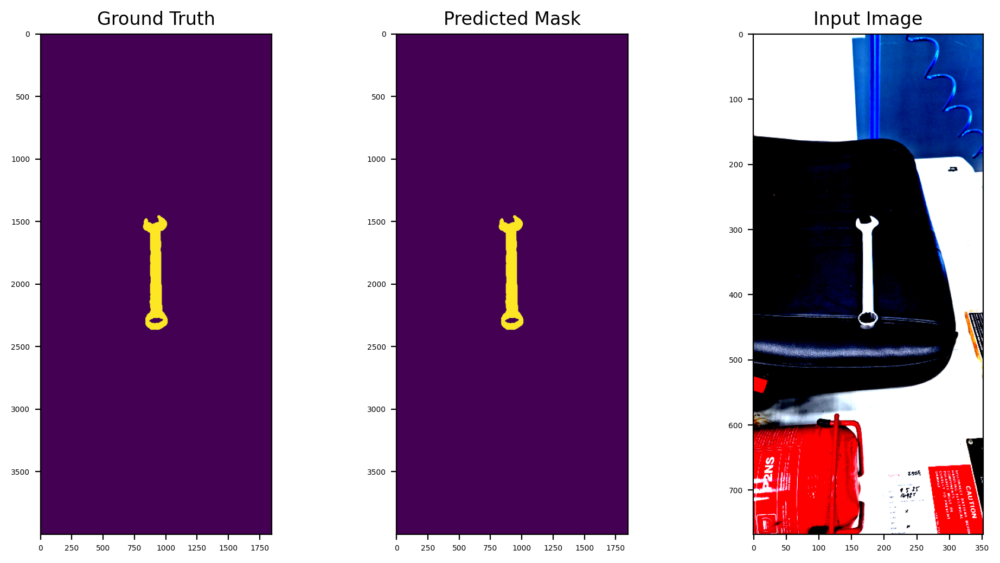

Processing images:  90%|█████████ | 9/10 [00:15<00:01,  1.71s/it]

torch.Size([1056, 384])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 384, 48, 22])]
dim = 384
Feature map shape: torch.Size([1, 384, 48, 22])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.6051416].


feature fra siste lag: tensor([[[[ 0.0256, -0.0340, -0.0091,  ...,  0.1464,  0.0113,  0.0466],
          [-0.2824, -0.1055, -0.1043,  ...,  0.0838, -0.1039, -0.0903],
          [-0.2526, -0.2202, -0.1833,  ...,  0.0412, -0.1915, -0.1612],
          ...,
          [-0.3118, -0.1028, -0.1433,  ..., -0.0425, -0.1583, -0.3742],
          [-0.2538, -0.1698, -0.1017,  ..., -0.0274, -0.0045, -0.0324],
          [-0.3453, -0.0954, -0.0060,  ...,  0.0706,  0.0111,  0.0963]],

         [[-0.4100, -0.3710, -0.3675,  ..., -0.5069, -0.3802, -0.3741],
          [-0.2746, -0.3443, -0.3774,  ..., -0.5051, -0.3194, -0.3464],
          [-0.3766, -0.2880, -0.3757,  ..., -0.4731, -0.3058, -0.3242],
          ...,
          [-0.2319, -0.2556, -0.1020,  ..., -0.2588, -0.2550, -0.1358],
          [-0.1803, -0.3038, -0.1237,  ..., -0.4184, -0.2586, -0.2720],
          [-0.2519, -0.2871, -0.1988,  ..., -0.4513, -0.2798, -0.3212]],

         [[ 0.2950,  0.5232,  0.4539,  ...,  0.0731,  0.4755,  0.1647],
       

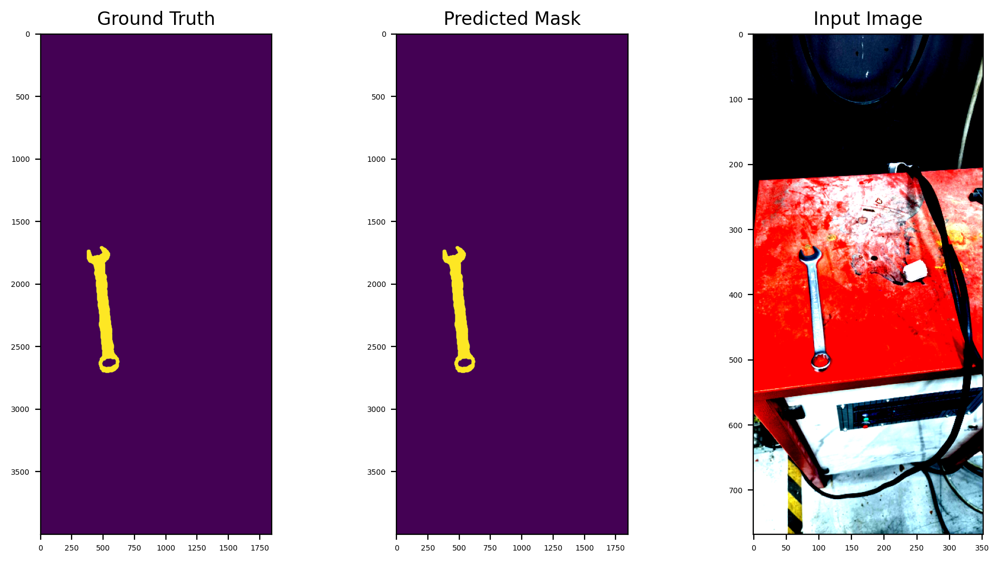

Processing images: 100%|██████████| 10/10 [00:17<00:00,  1.72s/it]

torch.Size([1056, 384])
Design matrix of size :  torch.Size([10201, 384])
Label matrix of size :  torch.Size([10201])


In [121]:
xs = []
ys = []
image_index = []

IMAGENET_MEAN = (0.485, 0.456, 0.406) # RGB mean for ImageNet
IMAGENET_STD = (0.229, 0.224, 0.225) # RGB std for ImageNet

# Self-attention lagene i DINOv3 ViT modellene
MODEL_TO_NUM_LAYERS = {
    MODEL_DINOV3_VITS: 12,
    MODEL_DINOV3_VITSP: 12,
    MODEL_DINOV3_VITB: 12,
    MODEL_DINOV3_VITL: 24,
    MODEL_DINOV3_VITHP: 32,
    MODEL_DINOV3_VIT7B: 40,
}

n_layers = MODEL_TO_NUM_LAYERS[MODEL_NAME]

# 
with torch.inference_mode():
    with torch.autocast(device_type='cuda', dtype=torch.float32):
        for i in tqdm(range(n_images), desc="Processing images"):

            # Loading the ground truth
            mask_i = labels[i].split()[-1]
            mask_i_resized = resize_transform(mask_i)
            mask_i_quantized = patch_quant_filter(mask_i_resized).squeeze().view(-1).detach().cpu()
            ys.append(mask_i_quantized)
            
            # Loading the image data 
            image_i = images[i].convert('RGB')
            image_i_resized = resize_transform(image_i)
            image_i_resized = TF.normalize(image_i_resized, mean=IMAGENET_MEAN, std=IMAGENET_STD)
            image_i_resized = image_i_resized.unsqueeze(0).cuda()

            # tar ut features fra alle lag i modellen
            # feats blir en liste med feature tensorer fra hvert lag
            # Forklaring av tensor: 
            # en tensor er (N, D, H, W) der N=1 (batch size), D=dimensjon på features, H og W er romlige dimensjoner
            feats = model.get_intermediate_layers(image_i_resized, n=range(n_layers), reshape=True, norm=True)
            
            print(f"Feature map shape: {len(feats)}, type: {type(feats)}")
            print(f"Siste tensor shape: {[feats[-1].shape]}")

            # tar med features fra siste lag
            # Vi endrer formen på tensoren slik at vi får en rad per patch
            # feats[-1] er siste lag, som har formen (1, D, H, W)
            dim = feats[-1].shape[1]

            print(f"dim = {dim}")
            print(f"Feature map shape: {feats[0].shape}")
            print(f"feature fra siste lag: {feats[-1]}")

            xs.append(feats[-1].squeeze().view(dim, -1).permute(1,0).detach().cpu())

            image_index.append(i * torch.ones(ys[-1].shape))

            # Visualization of ground truth, predicted mask, input image
            plt.figure(figsize=(12, 6), dpi=200)
            plt.subplot(1, 3, 1)
            plt.imshow(labels[i])
            plt.title("Ground Truth")
            
            plt.subplot(1, 3, 2)
            plt.imshow(mask_i)
            plt.title("Predicted Mask")

            plt.subplot(1, 3, 3)
            plt.imshow(image_i_resized.squeeze().permute(1,2,0).detach().cpu())
            plt.title("Input Image")
    
            plt.show()

            print(xs[i].shape)

# Concatenate all lists into torch tensors 
xs = torch.cat(xs)
ys = torch.cat(ys)
image_index = torch.cat(image_index)

# keeping only the patches that have clear positive or negative label
idx = (ys < 0.01) | (ys > 0.99)
xs = xs[idx]
ys = ys[idx]
image_index = image_index[idx]

print("Design matrix of size : ", xs.shape)
print("Label matrix of size : ", ys.shape)


validation using image_01.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


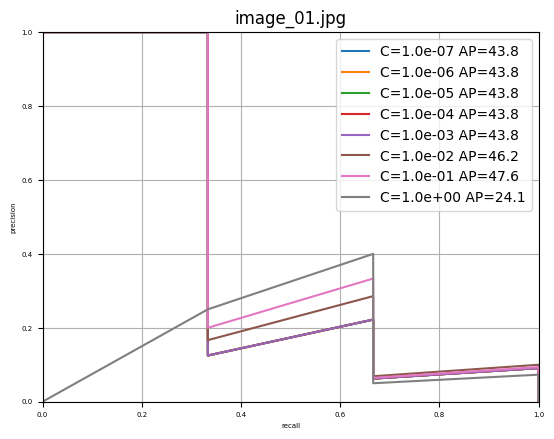

validation using image_02.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


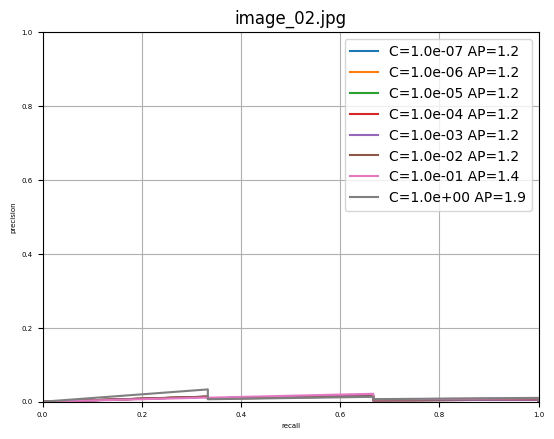

validation using image_03.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


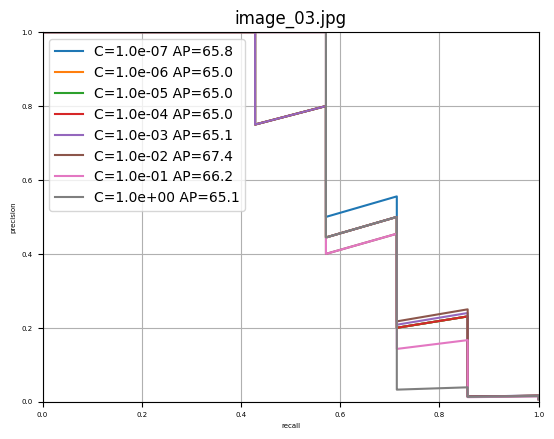

validation using image_04.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


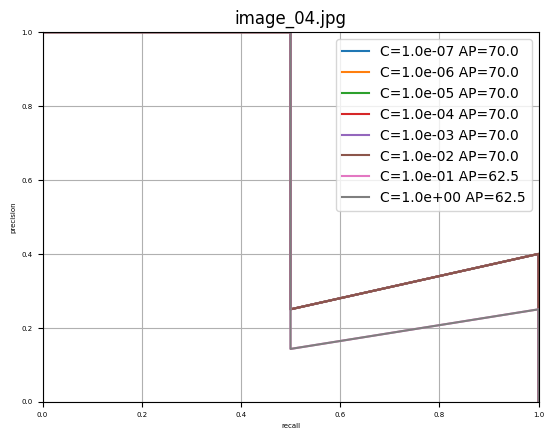

validation using image_05.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


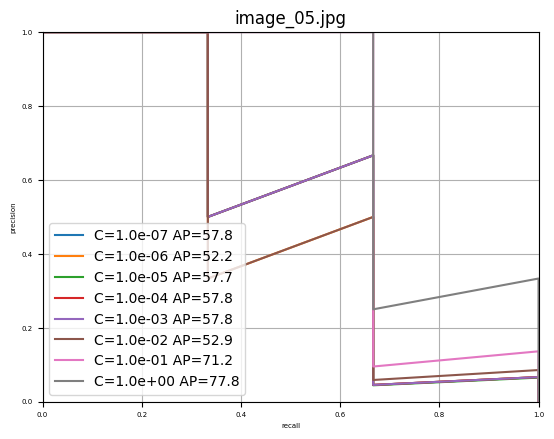

validation using image_06.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


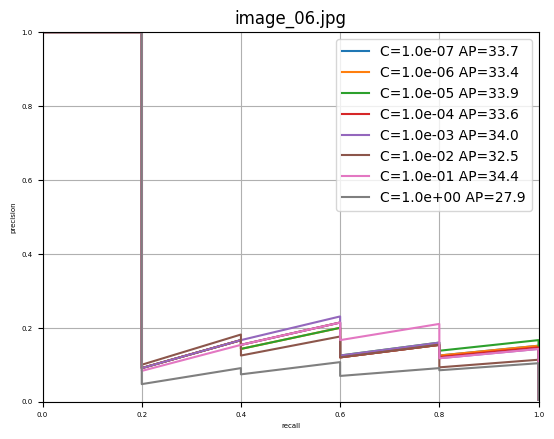

validation using image_07.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


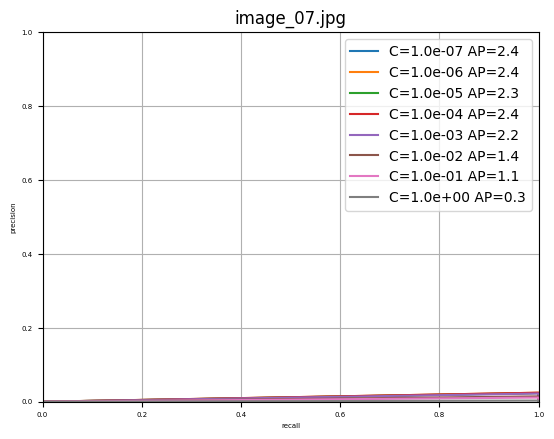

validation using image_08.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


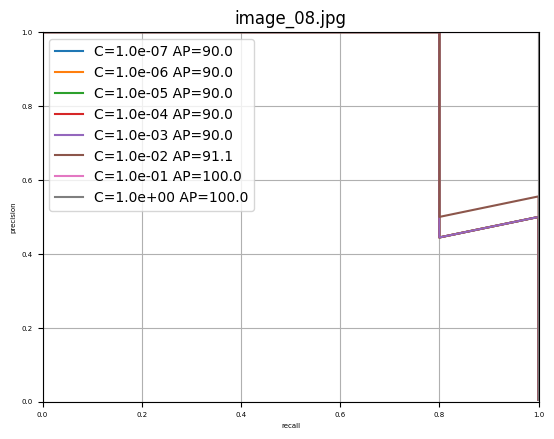

validation using image_09.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


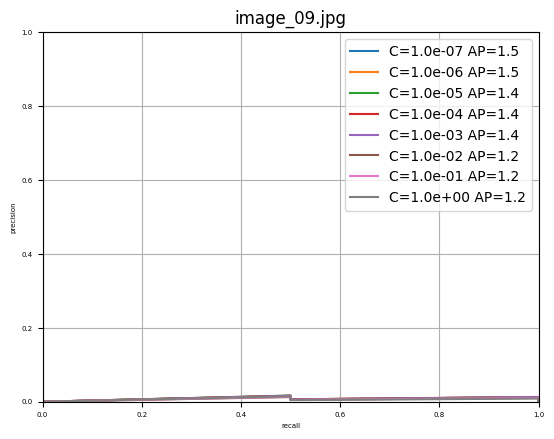

validation using image_10.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


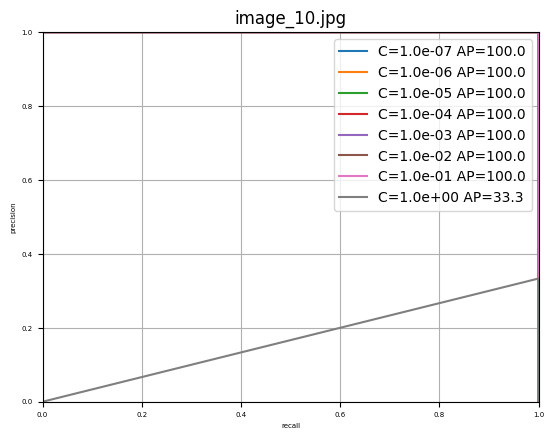

In [122]:
cs = np.logspace(-7, 0, 8)
scores = np.zeros((n_images, len(cs)))

for i in range(n_images):
    print('validation using image_{:02d}.jpg'.format(i+1))
    train_selection = image_index != float(i)
    fold_x = xs[train_selection].numpy()
    fold_y = (ys[train_selection] > 0).long().numpy()
    val_x = xs[~train_selection].numpy()
    val_y = (ys[~train_selection] > 0).long().numpy()

    plt.figure()
    for j, c in enumerate(cs):
        print("training logisitic regression with C={:.2e}".format(c))
        clf = LogisticRegression(random_state=0, C=c, max_iter=10000).fit(fold_x, fold_y)
        output = clf.predict_proba(val_x)
        precision, recall, thresholds = precision_recall_curve(val_y, output[:, 1])
        s = average_precision_score(val_y, output[:, 1])
        scores[i, j] = s
        plt.plot(recall, precision, label='C={:.1e} AP={:.1f}'.format(c, s*100))

    plt.grid()
    plt.xlabel('recall')
    plt.title('image_{:02d}.jpg'.format(i+1))
    plt.ylabel('precision')
    plt.axis([0, 1, 0, 1])
    plt.legend()
    plt.show()


In [123]:
print(len(scores))
print(scores.shape)
print(scores)

print(np.max(scores, axis=1))

10
(10, 8)
[[0.43771044 0.43771044 0.43771044 0.43771044 0.43771044 0.46190476
  0.47569444 0.24105691]
 [0.01225902 0.01218396 0.01228504 0.01229175 0.01229457 0.01213593
  0.01404857 0.01899834]
 [0.65753667 0.64957293 0.64954633 0.64956222 0.65091885 0.67435583
  0.66221815 0.65059692]
 [0.7        0.7        0.7        0.7        0.7        0.7
  0.625      0.625     ]
 [0.57777778 0.52222222 0.57729469 0.57777778 0.57777778 0.52857143
  0.71212121 0.77777778]
 [0.33726274 0.33440559 0.33866667 0.33637147 0.34005861 0.32515426
  0.34430307 0.27862554]
 [0.02380952 0.02439024 0.02325581 0.02439024 0.02222222 0.01449275
  0.01123596 0.0031348 ]
 [0.9        0.9        0.9        0.9        0.9        0.91111111
  1.         1.        ]
 [0.01450617 0.01464833 0.01439363 0.01407148 0.01426562 0.01153745
  0.0118329  0.01164479]
 [1.         1.         1.         1.         1.         1.
  1.         0.33333333]]
[0.47569444 0.01899834 0.67435583 0.7        0.77777778 0.34430307
 0.024

1.0


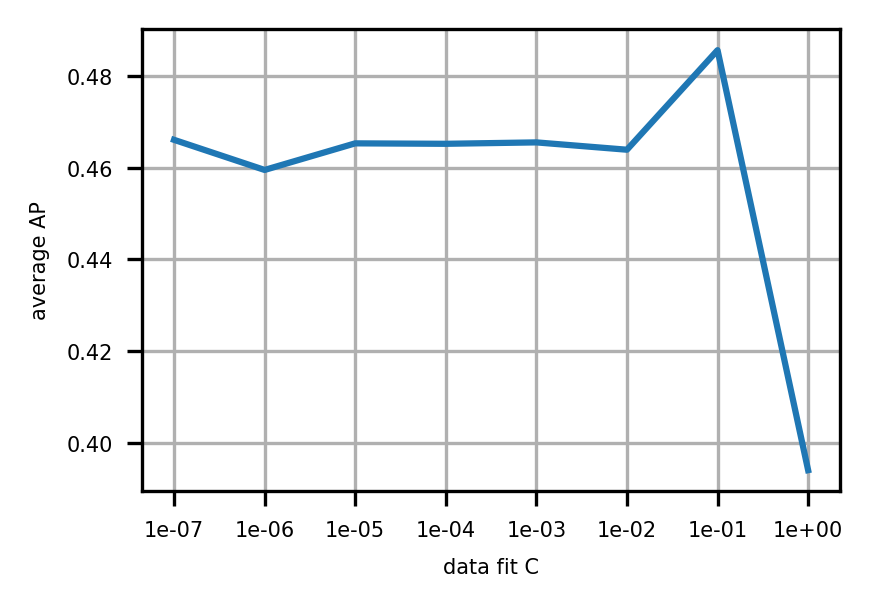

In [124]:
plt.figure(figsize=(3, 2), dpi=300)
plt.rcParams.update({
    "xtick.labelsize": 5,
    "ytick.labelsize": 5,
    "axes.labelsize": 5,
})

print(c)
plt.plot(scores.mean(axis=0))
plt.xticks(np.arange(len(cs)), ["{:.0e}".format(c) for c in cs])
plt.xlabel('data fit C')
plt.ylabel('average AP')
plt.grid()
plt.show()

In [125]:
print(xs.shape)
print(ys.shape)


torch.Size([10201, 384])
torch.Size([10201])


In [126]:
clf = LogisticRegression(random_state=0, C=0.1, max_iter=100000, verbose=2).fit(xs.numpy(), (ys > 0).long().numpy())

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished


### Steg 5

Loaded 20250925_100944.jpg from ./Testedata
Loaded 20250925_101022.jpg from ./Testedata
Loaded 20250925_101026.jpg from ./Testedata
Loaded 20250925_101057.jpg from ./Testedata
Loaded 20250925_101337.jpg from ./Testedata
Loaded Image_test_07.jpg from ./Testedata
Loaded images (1).jpg from ./Testedata
Loaded images (2).jpg from ./Testedata
Loaded images (3).jpg from ./Testedata
Loaded images (4).jpg from ./Testedata
Loaded images (5).jpg from ./Testedata
Loaded images (6).jpg from ./Testedata
Loaded images.jpg from ./Testedata
Total images loaded from ./Testedata: 13



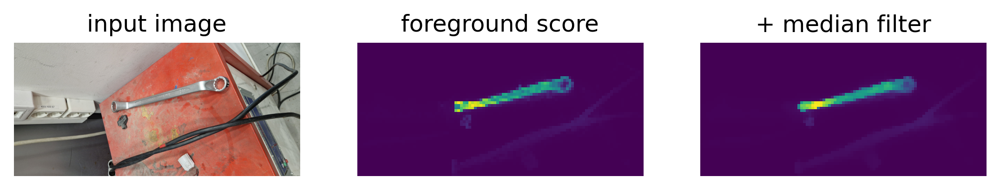

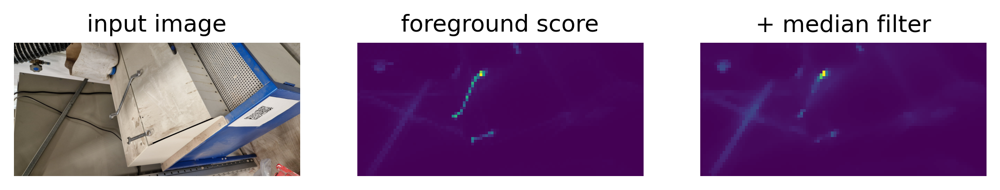

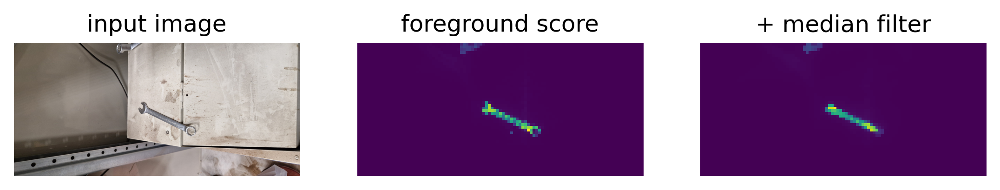

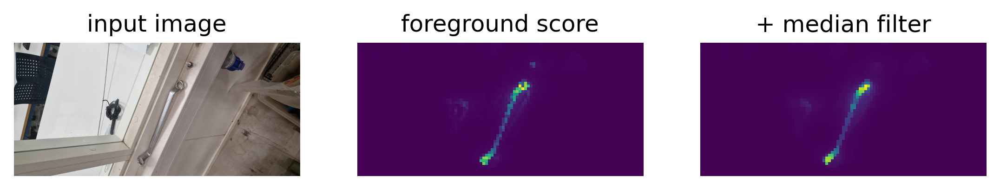

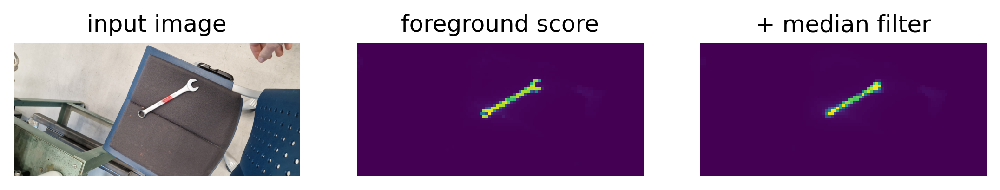

...

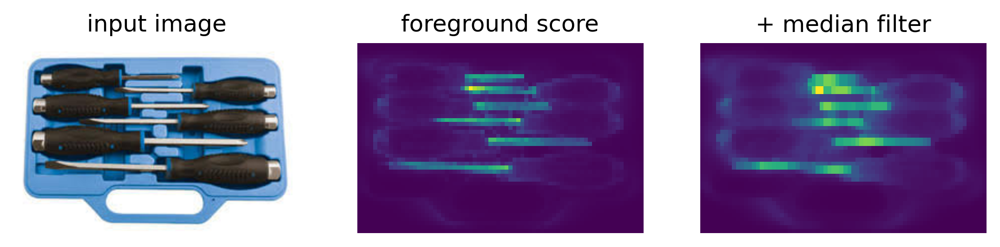

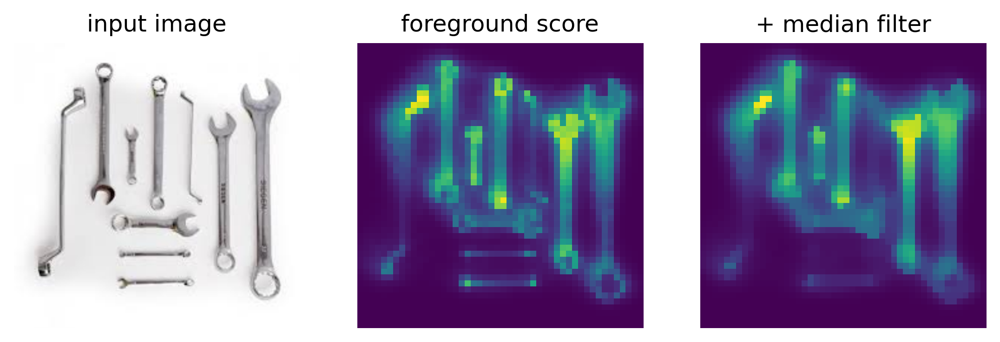

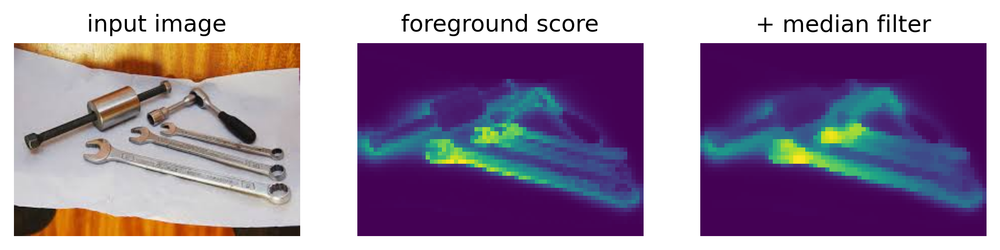

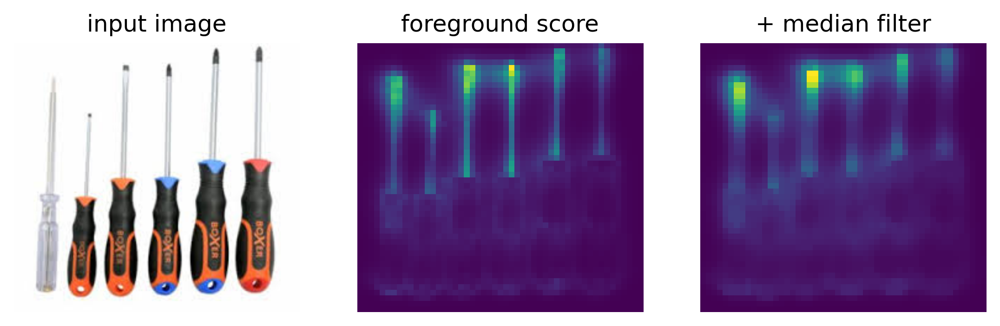

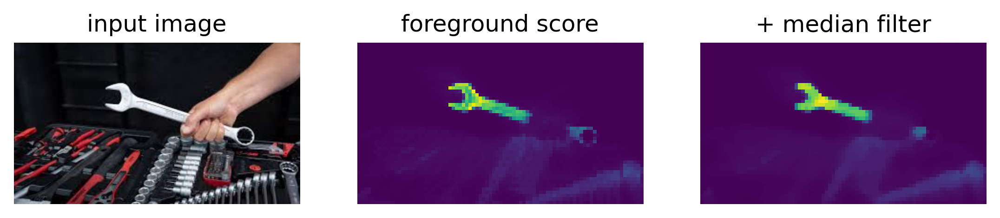

In [127]:
test_image_fpath = "./Testedata"
test_image_fpath= "./Testedata"
def load_image_from_url(url: str) -> Image:
    with urllib.request.urlopen(url) as f:
        return Image.open(f).convert("RGB")

test_folder = "./Testedata"

def load_images_from_folder(folder: str) -> list[Image.Image]:
    images = []
    for filename in sorted(os.listdir(folder)):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            img = Image.open(os.path.join(folder, filename))
            images.append(img)
            print(f"Loaded {filename} from {folder}")

    print(f"Total images loaded from {folder}: {len(images)}\n")
    return images

test_images = load_images_from_folder(test_folder)

def testData(image):
    test_image = image

    test_image_resized = resize_transform(test_image)
    test_image_normalized = TF.normalize(test_image_resized, mean=IMAGENET_MEAN, std=IMAGENET_STD)

    with torch.inference_mode():
        with torch.autocast(device_type='cuda', dtype=torch.float32):
            feats = model.get_intermediate_layers(test_image_normalized.unsqueeze(0).cuda(), n=range(n_layers), reshape=True, norm=True)
            x = feats[-1].squeeze().detach().cpu()
            dim = x.shape[0]
            x = x.view(dim, -1).permute(1, 0)

    h_patches, w_patches = [int(d / PATCH_SIZE) for d in test_image_resized.shape[1:]]

    fg_score = clf.predict_proba(x)[:, 1].reshape(h_patches, w_patches)
    fg_score_mf = torch.from_numpy(signal.medfilt2d(fg_score, kernel_size=3))

    plt.figure(figsize=(9, 3), dpi=300)
    plt.subplot(1, 3, 1)
    plt.axis('off')
    plt.imshow(test_image_resized.permute(1, 2, 0))
    plt.title('input image')
    plt.subplot(1, 3, 2)
    plt.axis('off')
    plt.imshow(fg_score)
    plt.title('foreground score')
    plt.subplot(1, 3, 3)
    plt.axis('off')
    plt.imshow(fg_score_mf)
    plt.title('+ median filter')
    plt.show()

for image in test_images:
    testData(image)


In [128]:
#%pip install opencv-python

In [129]:
import cv2

def show_video_with_foreground_mask(video_path, model, clf, resize_transform, 
                                IMAGENET_MEAN, IMAGENET_STD, PATCH_SIZE, n_layers,
                                apply_median_filter=True, show_original=True, 
                                fps_limit=30, window_size=(1200, 600)):
    """
    Display video with real-time foreground segmentation overlay
    
    Args:
        video_path: Path to input video file
        model: DINOv3 model
        clf: Trained classifier
        resize_transform: Resize transform function
        IMAGENET_MEAN: ImageNet normalization mean
        IMAGENET_STD: ImageNet normalization std
        PATCH_SIZE: Patch size (16)
        n_layers: Number of layers in model
        apply_median_filter: Whether to apply median filter smoothing
        show_original: Whether to show original video alongside mask
        fps_limit: Maximum FPS for display
        window_size: (width, height) for display window
    
    Controls:
        - Press 'q' to quit
        - Press 'space' to pause/resume
        - Press 's' to save current frame
    """
    
    def process_frame_for_segmentation(frame):
        """Process a single frame and return foreground mask"""
        # Convert BGR to RGB
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame_pil = Image.fromarray(frame_rgb)
        
        # Preprocess
        frame_resized = resize_transform(frame_pil)
        frame_normalized = TF.normalize(frame_resized, mean=IMAGENET_MEAN, std=IMAGENET_STD)
        
        # Extract features
        with torch.inference_mode():
            with torch.autocast(device_type='cuda', dtype=torch.float32):
                feats = model.get_intermediate_layers(
                    frame_normalized.unsqueeze(0).cuda(), 
                    n=range(n_layers), 
                    reshape=True, 
                    norm=True
                )
                x = feats[-1].squeeze().detach().cpu()
                dim = x.shape[0]
                x = x.view(dim, -1).permute(1, 0)
        
        # Get foreground scores
        h_patches, w_patches = [int(d / PATCH_SIZE) for d in frame_resized.shape[1:]]
        fg_score = clf.predict_proba(x)[:, 1].reshape(h_patches, w_patches)
        
        # Apply median filter if requested
        if apply_median_filter:
            fg_score = signal.medfilt2d(fg_score, kernel_size=3)
        
        return fg_score, frame_resized
    
    # Open video
    cap = cv2.VideoCapture(video_path)
    
    if not cap.isOpened():
        print(f"Error: Could not open video {video_path}")
        return
    
    # Get video properties
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    original_fps = cap.get(cv2.CAP_PROP_FPS)
    
    print(f"Video: {total_frames} frames at {original_fps:.1f} FPS")
    print("Controls: 'q' to quit, 'space' to pause/resume, 's' to save frame")
    
    # Calculate frame delay for FPS limiting
    frame_delay = max(1, int(1000 / min(fps_limit, original_fps)))
    
    paused = False
    frame_count = 0
    
    while True:
        if not paused:
            ret, frame = cap.read()
            if not ret:
                print("End of video reached")
                break
            
            frame_count += 1
        
        try:
            # Process frame for segmentation
            fg_score, frame_resized = process_frame_for_segmentation(frame)
            
            # Convert tensors to numpy for display
            frame_np = (frame_resized.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
            
            # Create colorized mask
            fg_score_norm = (fg_score * 255).astype(np.uint8)
            mask_colored = cv2.applyColorMap(fg_score_norm, cv2.COLORMAP_HOT)
            
            # Resize mask to match frame size
            frame_height, frame_width = frame_np.shape[:2]
            mask_resized = cv2.resize(mask_colored, (frame_width, frame_height))
            
            if show_original:
                # Show original and mask side by side
                frame_bgr = cv2.cvtColor(frame_np, cv2.COLOR_RGB2BGR)
                combined = np.hstack([frame_bgr, mask_resized])
                
                # Add text overlay
                cv2.putText(combined, f"Frame: {frame_count}/{total_frames}", 
                        (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
                cv2.putText(combined, "Original", (10, frame_height - 10), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
                cv2.putText(combined, "Foreground Mask", (frame_width + 10, frame_height - 10), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
                
                display_frame = combined
            else:
                # Show only the mask
                cv2.putText(mask_resized, f"Frame: {frame_count}/{total_frames}", 
                        (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
                display_frame = mask_resized
            
            # Resize for display if needed
            display_height, display_width = display_frame.shape[:2]
            if display_width > window_size[0] or display_height > window_size[1]:
                scale = min(window_size[0] / display_width, window_size[1] / display_height)
                new_width = int(display_width * scale)
                new_height = int(display_height * scale)
                display_frame = cv2.resize(display_frame, (new_width, new_height))
            
            # Show frame
            cv2.imshow('Foreground Segmentation', display_frame)
            
        except Exception as e:
            print(f"Error processing frame {frame_count}: {e}")
            continue
        
        # Handle keyboard input
        key = cv2.waitKey(frame_delay) & 0xFF
        
        if key == ord('q'):
            print("Quitting...")
            break
        elif key == ord(' '):  # Space bar
            paused = not paused
            print("Paused" if paused else "Resumed")
        elif key == ord('s'):  # Save frame
            filename = f"frame_{frame_count:06d}_segmentation.png"
            cv2.imwrite(filename, display_frame)
            print(f"Saved {filename}")
    
    # Cleanup
    cap.release()
    cv2.destroyAllWindows()
    print("Video display ended")

# Usage example:
show_video_with_foreground_mask(
    0,
    model, clf, resize_transform,
    IMAGENET_MEAN, IMAGENET_STD, PATCH_SIZE, n_layers
)

Video: -1 frames at 30.0 FPS
Controls: 'q' to quit, 'space' to pause/resume, 's' to save frame
Quitting...
Video display ended


In [130]:
save_root = '.'
model_path = os.path.join(save_root, "fg_classifier.pkl")
with open(model_path, "wb") as f:
  pickle.dump(clf, f)